# Spatially informed Bivariate metrics  

Computation of local scores implemented in LIANA+. These scores are used to identify spatially co-expressed ligand-receptor pairs. However, they are also applicable to other types of spatially-informed bivariate analyses. 

### Load packages  

Environment ``liana``

In [ ]:
# Generic
import pandas as pd
import numpy as np

# single cell
import scanpy as sc
import squidpy as sq
import decoupler as dc
import plotnine as p9
import liana as li

### Load and normalize data

In [2]:
folder = '/lustre/groups/ml01/workspace/sara.jimenez/spatial_pancreas_data/preprocessed_data/data4downstream/'
adata = sc.read(folder+'S1_ct_based_niche_label_npod_annotated.h5ad')
adata

AnnData object with n_obs × n_vars = 108711 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
    uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'spatial', 'spatial_fov'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

In [3]:
adata.X.max(),adata.layers['counts'].max()

(4.715945, 285)

The data is already normalized

### Background   

The idea is to use spatially-informed bivariate metrics to assess the spatial relationship between two variables. Specifically, we focus on local bivariate similarity metrics. In contrast to other spatial Methods, including Misty; focusing on local spatial relationships enables us to pinpoint the exact location of spatial relationships, and to identify spatial relationships that might occur only in a specific sub-region of our samples.

The authors of Liana+ saw that on average when used to identify local ligand-receptor relationships, spatially-weighted Cosine similarity did best. However, they expect that other scoring functions might be better suited for other tasks, e.g. Spatially-weighted Jaccard Similarity should be well suited for categorical data.

### Available local funtions

In [4]:
li.mt.bivariate.show_functions()

,name,metadata,reference
0,pearson,weighted Pearson correlation coefficient,None
1,spearman,weighted Spearman correlation coefficient,None
2,cosine,weighted Cosine similarity,None
3,jaccard,weighted Jaccard similarity,None
4,product,simple weighted product,If vars are z-scaled = Lee's static (Lee 2021;...
5,norm_product,normalized weighted product,None
6,morans,Moran's R,"Li, Z., Wang, T., Liu, P. and Huang, Y., 2022...."
7,masked_spearman,masked & weighted Spearman correlation,"Ghazanfar, S., Lin, Y., Su, X., Lin, D.M., Pat..."


The local functions work are quite simple, as they are simply weighted versions of well-known similarity metrics. The way that spatially-informed methods usually work is by making use of weights based on the proximity (or spatial connectivity) between spots/cells.  

The spatial weights in LIANA+ are by default defined as a family of radial kernels that use the inverse Euclidean distance between cells/spots to bind the weights between 0 and 1, with spots that are closest having the highest spatial connectivity to one another (1), while those that are thought to be too far to be in contact are assigned 0.  

LIANA’s connectivities are flexible and can be defined in any way that fits the user. The authors have thus aligned LIANA’s ```spatial_neighbors``` function to Squidpy’s ```spatial_neighbors``` function. A perfectly viable solution would be to use Squidpy’s nearest neighbors graph, which one can use to easily replace LIANA’s radial kernel connecitivies.  

In this case it's more suitable to use neighbors from squidpy, because they can be computed per fov. 

In [5]:
sq.gr.spatial_neighbors(adata, spatial_key='spatial',library_key='fov',n_neighs=50)#,delaunay=True)
adata

AnnData object with n_obs × n_vars = 108711 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
    uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'spatial', 'spatial_fov'
    layers: 'counts'
    obsp: 'spatial_connectivities', 'spatial_distances'

### Bivariate Ligand-Receptor Relationships  

Let’s see how these scores look for potential ligand-receptor interactions. Note that LIANA+ will take the presence of heteromeric complexes into account at the individual spot-level!

I computed only for two representative fovs. Otherwise, we need more memory

In [6]:
fovs = ['10','12']

In [26]:
adatas = []
for i in fovs:
    #fov = str(i+1)
    adata_sub = adata[adata.obs['fov'] == i]
    li.mt.bivariate(adata_sub,
                    resource_name='consensus', # NOTE: uses HUMAN gene symbols!
                    local_name='cosine', # Name of the function
                    global_name="morans", # Name global function
                    n_perms=100, # Number of permutations to calculate a p-value
                    mask_negatives=False, # Whether to mask LowLow/NegativeNegative interactions
                    add_categories=True, # Whether to add local categories to the results
                    nz_prop=0.1, # Minimum expr. proportion for ligands/receptors and their subunits
                    use_raw=False,
                    verbose=True
                    )
    adatas.append(adata_sub)

Using `.X`!
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
Using resource `consensus`.
100%|██████████| 100/100 [00:02<00:00, 33.99it/s]
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/liana/method/sp/_bivariate/_spatial_bivariate.py:343: ImplicitModificationWarning: Setting element `.obsm['local_scores']` of view, initializing view as actual.
Using `.X`!
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/anndata/_core/anndata.py:430: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
Using resource `consensus`.
100%|██████████| 100/100 [00:03<00:00, 32.40it/s]
/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/liana/method/sp/_bivariate/_spatial_bivariate.py:343: ImplicitModificationWarning: Setting element `.obsm['local_scores']` of view, initializin

Now that this is done, we can extract and explore the newly-created AnnData object that counts our local scores (stored as an AnnData in ```.obsm```)

In [27]:
adatas

[AnnData object with n_obs × n_vars = 4423 × 979
     obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
     uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
     obsm: 'X_pca', 'X_umap', 'design_matrix', 'spatial', 'spatial_fov', 'local_scores'
     layers: 'counts'
     obsp: 'spatial_connectivities', 'spatial_distances',
 AnnD

In [28]:
lrdata_t1 = adatas[0].obsm['local_scores']
lrdata_nd = adatas[1].obsm['local_scores']

In addition to the local bivariate scores, we can also get the “global” scores for each pair of variables, which we can use to choose the best pairs of variables to visualize. Moreover, a useful property of Bivariate Moran’s R is that it is bound between -1 (perfect negative spatial co-expression) and 1 (perfect positive spatial co-expression). Thus, it can be used to identify pairs of variables that are spatially clustered together or apart.

#### T1D FOV

In [29]:
lrdata_t1.var.sort_values("mean", ascending=False).head(3)

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
INS^INSR,INS,INSR,0.411943,0.393624,0.244422,0.39905,-0.082358,0.00,0.314566,0.133058
ARF1^INSR,ARF1,INSR,0.145668,0.263170,0.244422,0.39905,0.002097,0.33,0.276590,0.143112
CALM3^INSR,CALM3,INSR,0.120791,0.216821,0.244422,0.39905,0.000865,0.76,0.267924,0.134667


In [30]:
lrdata_t1.var.sort_values("std", ascending=False).head(3)

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
SPP1^CD44,SPP1,CD44,0.079719,0.135655,0.119062,0.213656,0.002784,0.18,0.179102,0.174237
LGALS1^ITGB1,LGALS1,ITGB1,0.054236,0.100837,0.103464,0.191499,0.005185,0.02,0.138934,0.168069
APP^CD74,APP,CD74,0.143397,0.249152,0.088837,0.123672,0.014302,0.00,0.171020,0.165245


In [31]:
lrdata_t1.var.sort_values("morans", ascending=False).head()

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
APP^CD74,APP,CD74,0.143397,0.249152,0.088837,0.123672,0.014302,0.00,0.171020,0.165245
VEGFA^ITGB1,VEGFA,ITGB1,0.101759,0.186977,0.103464,0.191499,0.011587,0.00,0.181027,0.154980
VEGFA^ITGAV,VEGFA,ITGAV,0.101759,0.186977,0.062331,0.114628,0.010155,0.00,0.143810,0.156013
LGALS1^ITGB1,LGALS1,ITGB1,0.054236,0.100837,0.103464,0.191499,0.005185,0.02,0.138934,0.168069
VIM^CD44,VIM,CD44,0.136490,0.227221,0.119062,0.213656,0.004808,0.04,0.177322,0.144145


... storing 'ligand' as categorical
... storing 'receptor' as categorical


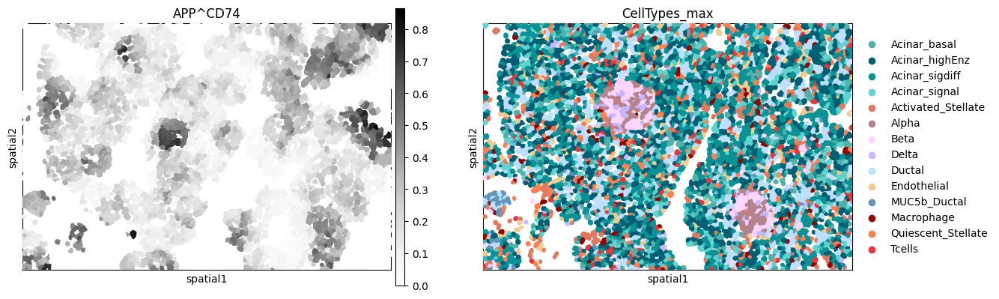

In [32]:
sq.pl.spatial_segment(lrdata_t1,color=['APP^CD74', 'CellTypes_max'],ncols=2,library_id=['10'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

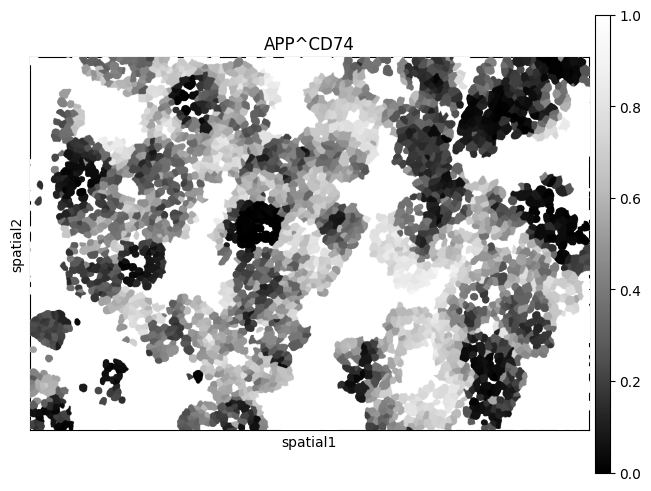

In [33]:
sq.pl.spatial_segment(lrdata_t1, layer='pvals', color=['APP^CD74'],ncols=2,library_id=['10'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys_r', img=False)

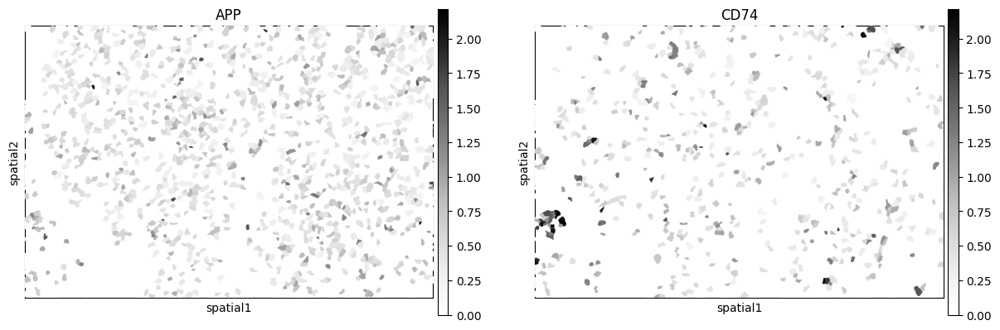

In [34]:
sq.pl.spatial_segment(adatas[0], color=['APP','CD74'],ncols=2,library_id=['10'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

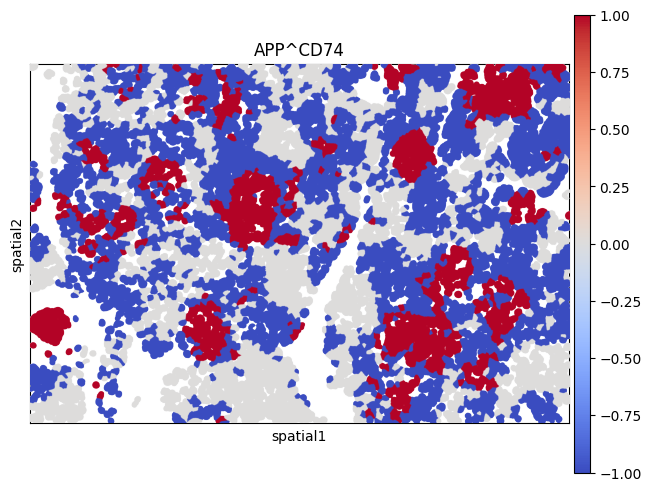

In [35]:
sq.pl.spatial_segment(lrdata_t1, layer='cats', color=['APP^CD74'],ncols=2,library_id=['10'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='coolwarm', img=False)

Here, we can distinguish areas in which the interaction between interaction members is positive (high-high) in Red (1), while interactions in which one is high the other is low or negative (High-low) are in Blue (-1). We also see that some interactions are neither, these are predominantly interactions in which both members are lowly-expressed (i.e. low-low); we see those in white (0).

In [62]:
lrdata_t1

AnnData object with n_obs × n_vars = 4423 × 31
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
    var: 'ligand', 'receptor', 'ligand_means', 'ligand_props', 'receptor_means', 'receptor_props', 'morans', 'morans_pvals', 'mean', 'std'
    uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap', 'nmf_errors', 'nmf_rank'
    obsm: 'X

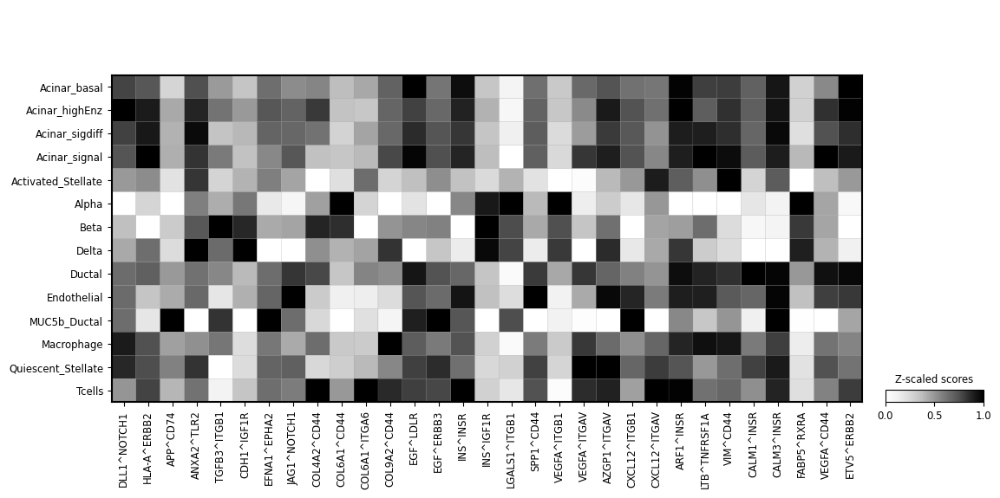

In [63]:
sc.pl.matrixplot(lrdata_t1, var_names=lrdata_t1.var_names, groupby='CellTypes_max', dendrogram=False, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys')

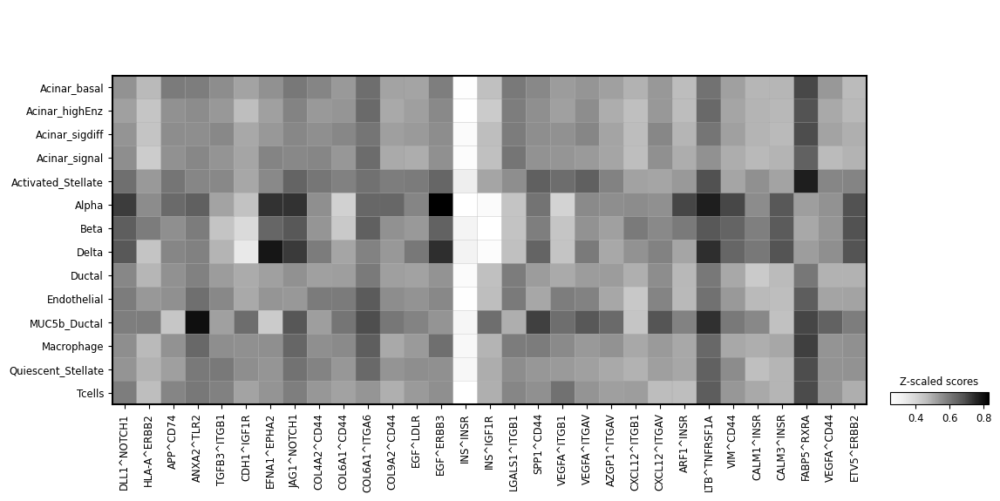

In [64]:
sc.pl.matrixplot(lrdata_t1, var_names=lrdata_t1.var_names, groupby='CellTypes_max', dendrogram=False, layer='pvals',
                 colorbar_title='Z-scaled scores', cmap='Greys')

#### ND FOV

In [36]:
lrdata_nd.var.sort_values("mean", ascending=False).head(3)

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
INS^INSR,INS,INSR,0.556980,0.423387,0.179328,0.262097,-0.047618,0.00,0.277719,0.143789
INS^IGF1R,INS,IGF1R,0.556980,0.423387,0.082092,0.135177,0.116430,0.00,0.230211,0.180435
ARF1^INSR,ARF1,INSR,0.155565,0.241167,0.179328,0.262097,-0.002308,0.32,0.224583,0.137955


In [37]:
lrdata_nd.var.sort_values("std", ascending=False).head(3)

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
TIMP1^CD63,TIMP1,CD63,0.079434,0.118088,0.174906,0.264785,0.096602,0.00,0.149472,0.196014
EFNA1^EPHA2,EFNA1,EPHA2,0.065414,0.104839,0.079281,0.109831,0.001799,0.45,0.140223,0.195744
VEGFA^ITGB1,VEGFA,ITGB1,0.103202,0.164939,0.102656,0.168011,0.092962,0.00,0.175092,0.193700


In [38]:
lrdata_nd.var.sort_values("morans", ascending=False).head()

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,morans,morans_pvals,mean,std
interaction,,,,,,,,,,
INS^IGF1R,INS,IGF1R,0.556980,0.423387,0.082092,0.135177,0.116430,0.0,0.230211,0.180435
TIMP1^CD63,TIMP1,CD63,0.079434,0.118088,0.174906,0.264785,0.096602,0.0,0.149472,0.196014
VEGFA^ITGB1,VEGFA,ITGB1,0.103202,0.164939,0.102656,0.168011,0.092962,0.0,0.175092,0.193700
VEGFA^ITGAV,VEGFA,ITGAV,0.103202,0.164939,0.062316,0.105607,0.038782,0.0,0.145159,0.178805
CDH1^IGF1R,CDH1,IGF1R,0.126883,0.199885,0.082092,0.135177,0.007093,0.0,0.167634,0.165664


... storing 'ligand' as categorical
... storing 'receptor' as categorical


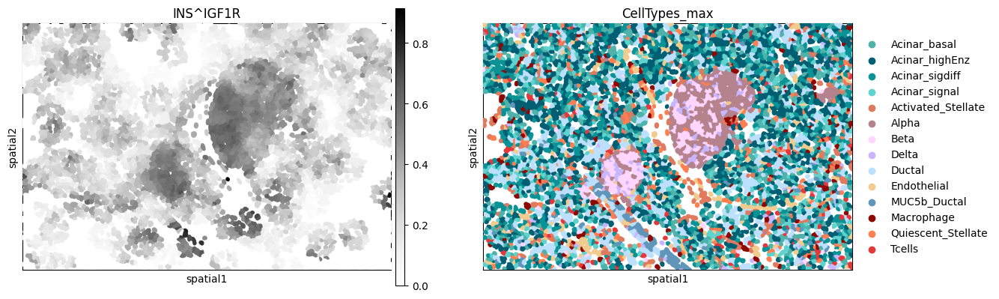

In [39]:
sq.pl.spatial_segment(lrdata_nd,color=['INS^IGF1R', 'CellTypes_max'],ncols=2,library_id=['12'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

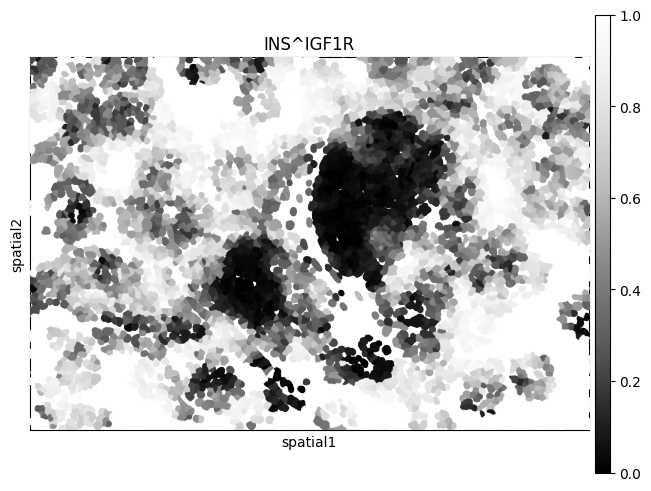

In [40]:
sq.pl.spatial_segment(lrdata_nd, layer='pvals', color=['INS^IGF1R'],ncols=2,library_id=['12'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys_r', img=False)

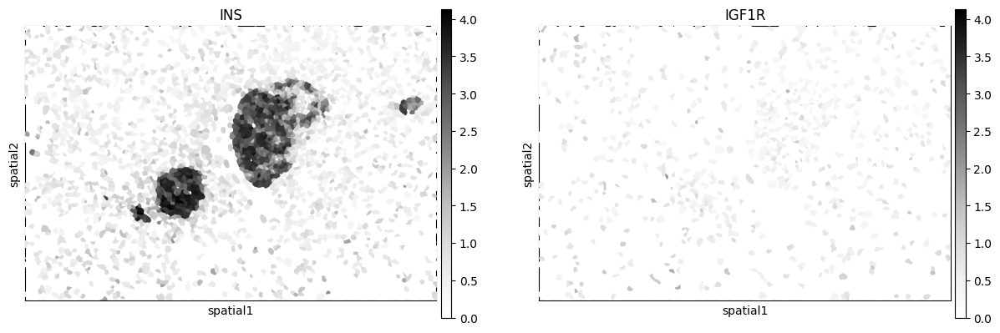

In [41]:
sq.pl.spatial_segment(adatas[1], color=['INS','IGF1R'],ncols=2,library_id=['12'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

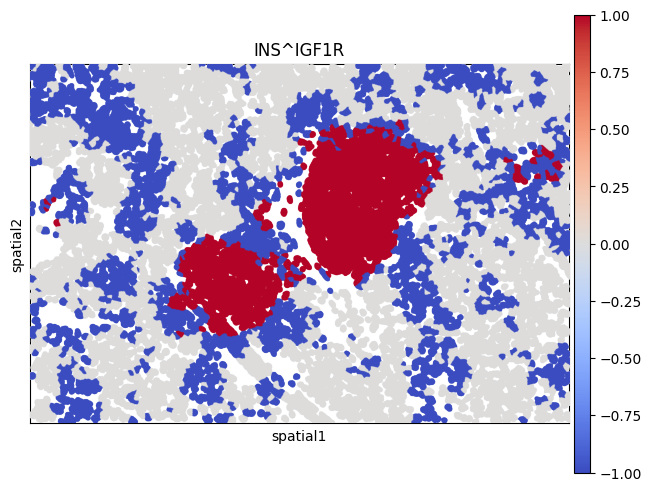

In [42]:
sq.pl.spatial_segment(lrdata_nd, layer='cats', color=['INS^IGF1R'],ncols=2,library_id=['12'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='coolwarm', img=False)

Here, we can distinguish areas in which the interaction between interaction members is positive (high-high) in Red (1), while interactions in which one is high the other is low or negative (High-low) are in Blue (-1). We also see that some interactions are neither, these are predominantly interactions in which both members are lowly-expressed (i.e. low-low); we see those in white (0).

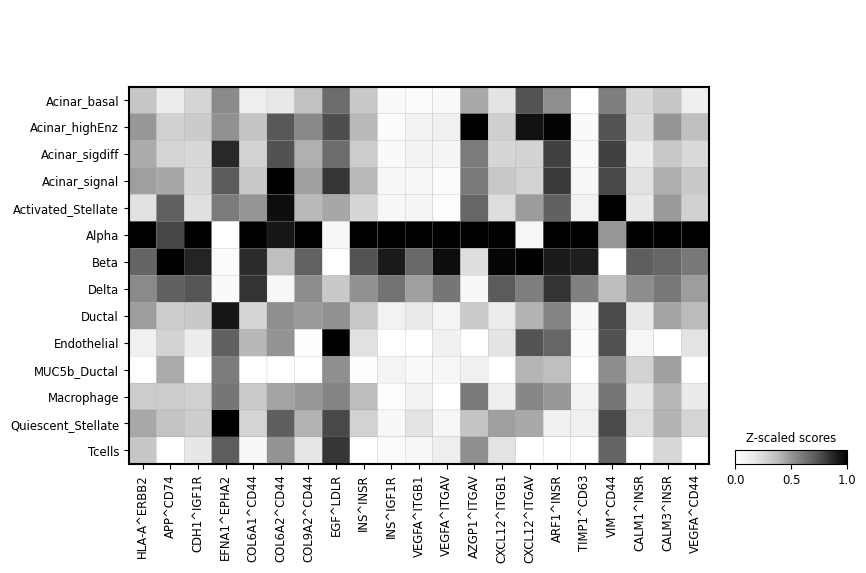

In [65]:
sc.pl.matrixplot(lrdata_nd, var_names=lrdata_nd.var_names, groupby='CellTypes_max', dendrogram=False, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys')

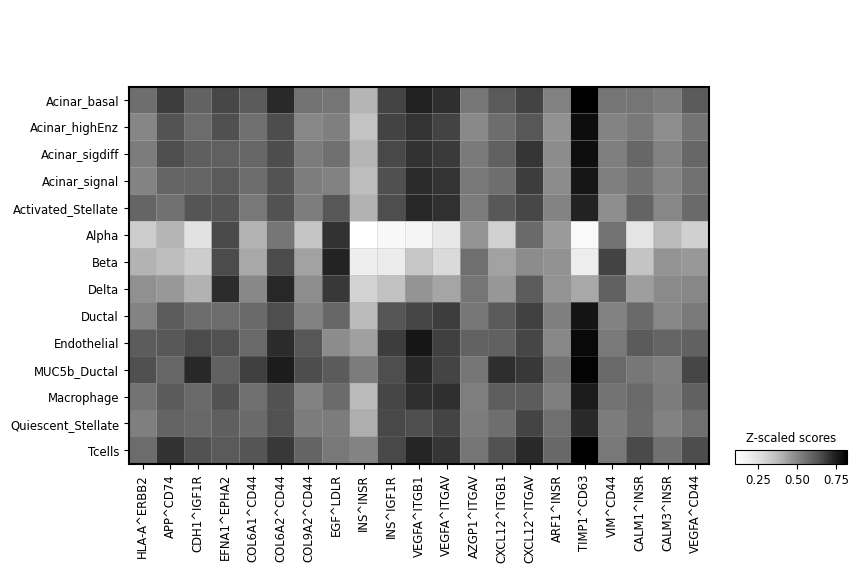

In [66]:
sc.pl.matrixplot(lrdata_nd, var_names=lrdata_nd.var_names, groupby='CellTypes_max', dendrogram=False, layer='pvals',
                 colorbar_title='Z-scaled scores', cmap='Greys')

### Identify Intercellular Patterns  

Now that we have estimated ligand-receptor scores, we can use non-negative matrix factorization (NMF) to identify coordinated cell-cell communication signatures. This would ultimately decompose the ligand-receptor scores into a basis matrix (W) and a coefficient matrix (H). We will use a very simple utility function (around sklearn’s NMF implementation) to do so, along with a simple k (component number) selection procedure.

One limitation of NMF is that it requires the number of components (factors) to be specified - a somewhat an arbitrary choice. To aid the selection of n_components, we provide a simple function that estimates an elbow based on reconstruction error. Another limitation is that it only accepts non-negative values, so it won’t work with metrics that can be negative (e.g. Pearson correlation). In this case, we use Cosine similarity with non-negative values, which results also in non-negative local scores.

#### T1D FOV

In [53]:
li.multi.nmf(lrdata_t1, n_components=3, inplace=True, 
             random_state=0, max_iter=200, verbose=True)

# Extract the variable loadings
lr_loadings_t1 = li.ut.get_variable_loadings(lrdata_t1, 
                                          varm_key='NMF_H').set_index('index')


# Extract the factor scores
factor_scores_t1 = li.ut.get_factor_scores(lrdata_t1, obsm_key='NMF_W')

nmf_t1 = sc.AnnData(X=lrdata_t1.obsm['NMF_W'],
                 obs=lrdata_t1.obs,
                 var=pd.DataFrame(index=lr_loadings_t1.columns),
                 uns=lrdata_t1.uns,
                 obsm=lrdata_t1.obsm)

/home/aih/sara.jimenez/miniconda3/envs/liana/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1770: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.


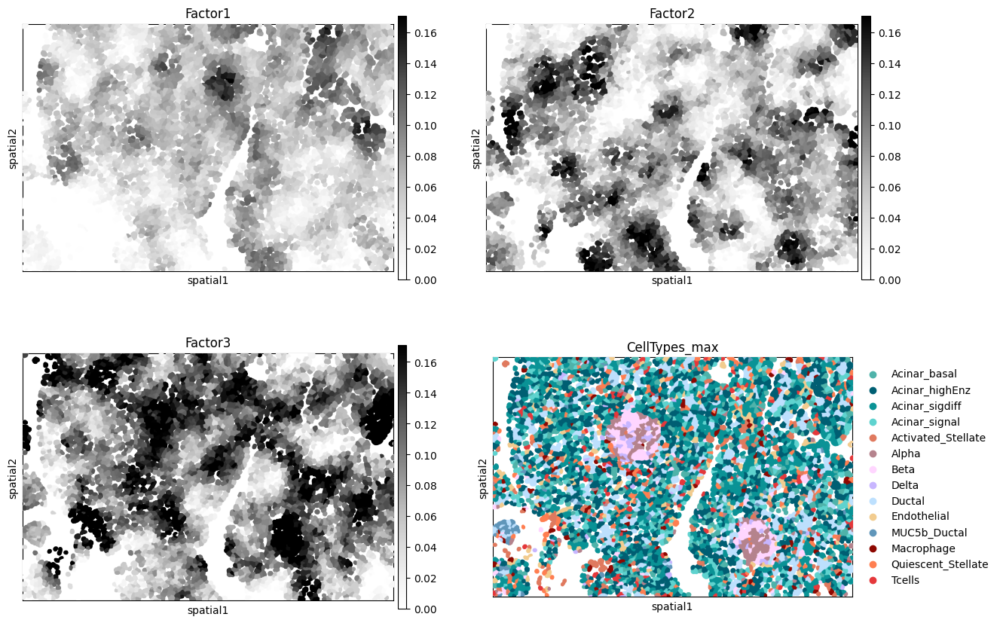

In [54]:
sq.pl.spatial_segment(nmf_t1,  color=[*nmf_t1.var.index,'CellTypes_max'],ncols=2,library_id=['10'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

We see that Factor 3 is mainly covering the islet areas of the fov, let’s check the interactions contributing the most to it:

In [55]:
lr_loadings_t1.sort_values("Factor3", ascending=False).head(10)

,Factor1,Factor2,Factor3
index,,,
INS^IGF1R,0.599164,0.369632,1.485752
INS^INSR,1.334767,1.351017,1.387697
LGALS1^ITGB1,0.000000,0.043480,1.315361
CXCL12^ITGAV,0.296214,0.000000,1.204270
TGFB3^ITGB1,0.192115,0.435498,1.184969
CDH1^IGF1R,1.214709,0.447446,1.183621
VEGFA^ITGB1,1.553110,0.047407,0.933165
ARF1^INSR,2.166575,0.901597,0.922883
COL6A1^CD44,0.771630,0.000000,0.872614


#### ND FOV

In [56]:
li.multi.nmf(lrdata_nd, n_components=3, inplace=True, 
             random_state=0, max_iter=200, verbose=True)

# Extract the variable loadings
lr_loadings_nd = li.ut.get_variable_loadings(lrdata_nd, 
                                          varm_key='NMF_H').set_index('index')


# Extract the factor scores
factor_scores_nd = li.ut.get_factor_scores(lrdata_nd, obsm_key='NMF_W')

nmf_nd = sc.AnnData(X=lrdata_nd.obsm['NMF_W'],
                 obs=lrdata_nd.obs,
                 var=pd.DataFrame(index=lr_loadings_nd.columns),
                 uns=lrdata_nd.uns,
                 obsm=lrdata_nd.obsm)

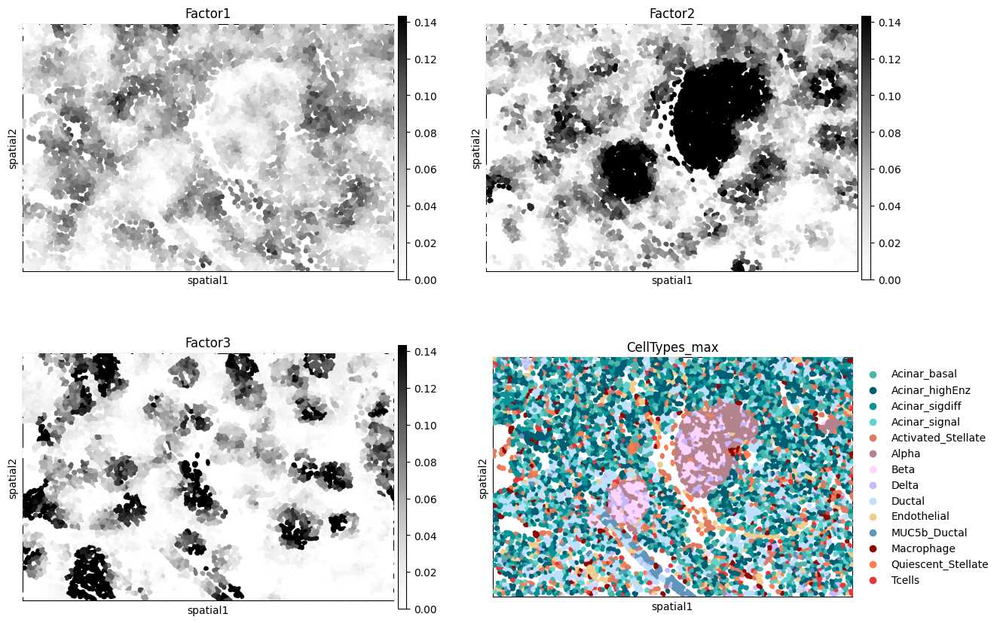

In [57]:
sq.pl.spatial_segment(nmf_nd,  color=[*nmf_nd.var.index,'CellTypes_max'],ncols=2,library_id=['12'],
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

We see that Factor 2 is mainly covering the islet areas of the fov, let’s check the interactions contributing the most to it:

In [59]:
lr_loadings_nd.sort_values("Factor2", ascending=False).head(10)

,Factor1,Factor2,Factor3
index,,,
TIMP1^CD63,0.000000,2.177413,0.000000
INS^IGF1R,1.166615,2.140671,0.398588
VEGFA^ITGB1,0.000000,2.016566,0.744361
VEGFA^ITGAV,0.529221,1.639439,0.000000
CDH1^IGF1R,0.908218,1.491321,0.371819
INS^INSR,2.845901,1.427316,0.981069
CALM1^INSR,1.860836,1.051212,0.041547
VEGFA^CD44,2.490257,1.049998,0.288658
COL9A2^CD44,2.177110,1.035717,0.655718


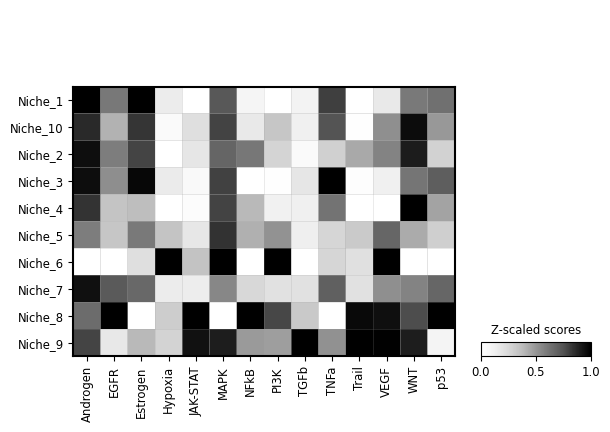

In [35]:
sc.pl.matrixplot(acts_progeny, var_names=acts_progeny.var_names, groupby='niche_label', dendrogram=False, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys')

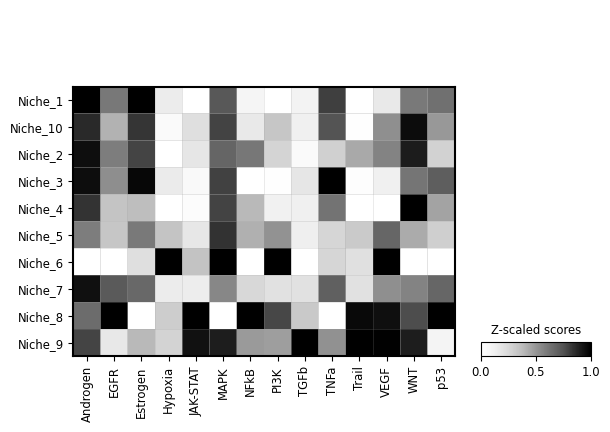

In [36]:
sc.pl.matrixplot(acts_progeny, var_names=acts_progeny.var_names, groupby='niche_label', dendrogram=False, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys')

In [28]:
acts_progeny.obsm['mlm_pvals']

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
1_1,0.402873,0.591395,0.392641,0.616070,0.141094,0.400085,0.456678,0.673549,0.039201,0.388394,0.371457,0.089261,0.792789,0.648869
2_1,0.511257,0.410928,0.507535,0.301143,0.448182,0.849587,0.580035,0.018788,0.456170,0.487791,0.308235,0.042584,0.357902,0.517749
3_1,0.583251,0.466369,0.138508,0.736093,0.446417,0.842609,0.172419,0.973332,0.776991,0.308472,0.140559,0.080522,0.967481,0.187717
4_1,0.340638,0.997972,0.528009,0.432922,0.693859,0.326551,0.822034,0.975142,0.154973,0.796863,0.347108,0.438683,0.877018,0.510997
5_1,0.905279,0.771595,0.931790,0.768282,0.732576,0.488352,0.191125,0.364727,0.136259,0.190641,0.761118,0.186586,0.585381,0.804376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4724_24,0.834169,0.338839,0.918859,0.425511,0.469581,0.929978,0.423762,0.984366,0.487981,0.533699,0.030943,0.755190,0.867496,0.673612
4725_24,0.408637,0.637338,0.855024,0.567867,0.566634,0.841490,0.386192,0.012303,0.524099,0.431180,0.578364,0.000361,0.682752,0.653810
4726_24,0.086700,0.167648,0.132148,0.286991,0.362770,0.498310,0.013016,0.297125,0.611973,0.005679,0.635676,0.565906,0.774206,0.145189
4727_24,0.881370,0.672745,0.953239,0.694947,0.580714,0.894716,0.459853,0.015094,0.566575,0.663214,0.000115,0.911475,0.937359,0.801476


In [29]:
acts_progeny

AnnData object with n_obs × n_vars = 108711 × 14
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'niche_label'
    uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'design_matrix', 'neighbors', 'niche_label_colors', 'pca', 'spatial', 'spatial_neighbors', 'umap', 'log1p'
    obsm: 'X_pca', 'X_umap', 'design_matrix', 'spatial', 'spatial_fov', 'mlm_estimate', 'mlm_pvals'
    obsp: 'spatial_connectivities', 'spatial_distances'

#### TF activity inference

In [22]:
net = dc.get_collectri(organism='human', split_complexes=False)
net

,source,target,weight,PMID
0,MYC,TERT,1,10022128;10491298;10606235;10637317;10723141;1...
1,SPI1,BGLAP,1,10022617
2,SMAD3,JUN,1,10022869;12374795
3,SMAD4,JUN,1,10022869;12374795
4,STAT5A,IL2,1,10022878;11435608;17182565;17911616;22854263;2...
...,...,...,...,...
43173,NFKB,hsa-miR-143-3p,1,19472311
43174,AP1,hsa-miR-206,1,19721712
43175,NFKB,hsa-miR-21-5p,1,20813833;22387281
43176,NFKB,hsa-miR-224-5p,1,23474441;23988648


In [23]:
dc.run_ulm(
    mat=adata,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True,
    use_raw=False
)


Running ulm on mat with 108711 samples and 979 targets for 469 sources.


100%|██████████| 11/11 [00:02<00:00,  4.99it/s]


In [24]:
acts = dc.get_acts(adata, obsm_key='ulm_estimate')

In [25]:
acts.var_names

Index(['ABL1', 'AHR', 'AIRE', 'AP1', 'APEX1', 'AR', 'ARID1A', 'ARID4B', 'ARNT',
       'ARX',
       ...
       'ZKSCAN7', 'ZMYND8', 'ZNF148', 'ZNF300', 'ZNF354C', 'ZNF362', 'ZNF382',
       'ZNF384', 'ZNF699', 'ZNF91'],
      dtype='object', length=469)

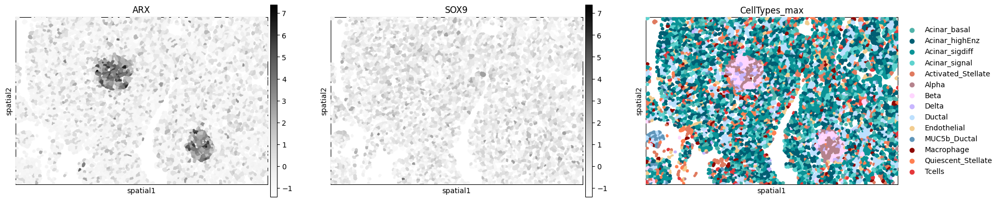

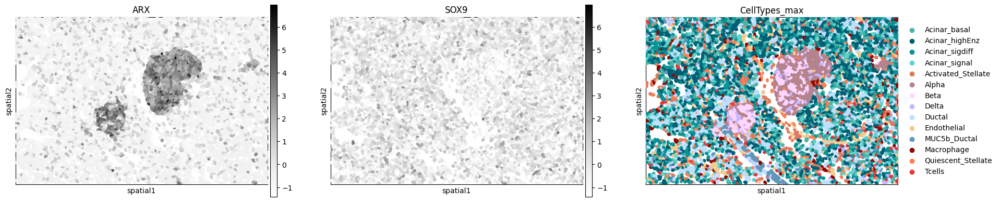

In [37]:
# Check how the TF activities look like
sq.pl.spatial_segment(acts,color=['ARX', 'SOX9', 'CellTypes_max'],ncols=3,
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

In [26]:
df = dc.rank_sources_groups(acts, groupby='CellTypes_max', reference='rest', method='t-test_overestim_var')

In [27]:
n_markers = 2
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers

{'Acinar_basal': ['NR0B2', 'KLF5'],
 'Acinar_highEnz': ['MZF1', 'KLF15'],
 'Acinar_sigdiff': ['KLF15', 'MTF1'],
 'Acinar_signal': ['ZNF362', 'KLF6'],
 'Activated_Stellate': ['SMAD3', 'SKIL'],
 'Alpha': ['ARX', 'ONECUT1'],
 'Beta': ['ZGLP1', 'MAFA'],
 'Delta': ['ARX', 'ISL1'],
 'Ductal': ['KLF8', 'SP4'],
 'Endothelial': ['ERG', 'HIVEP2'],
 'MUC5b_Ductal': ['ESR2', 'BHLHA15'],
 'Macrophage': ['RFXAP', 'RFXANK'],
 'Quiescent_Stellate': ['SKIL', 'SMAD3'],
 'Tcells': ['TBX21', 'STAT4']}

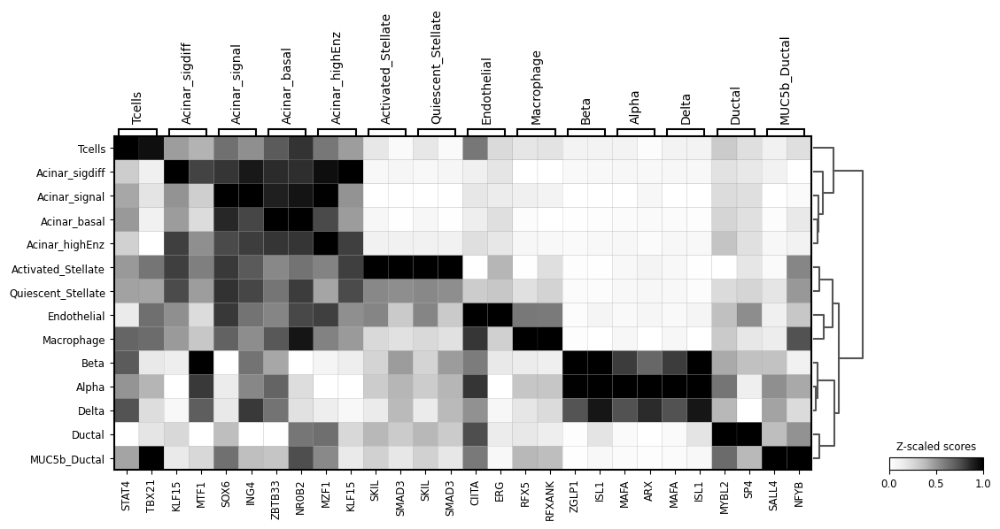

In [40]:
sc.pl.matrixplot(acts_10, source_markers_10, 'CellTypes_max', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys')

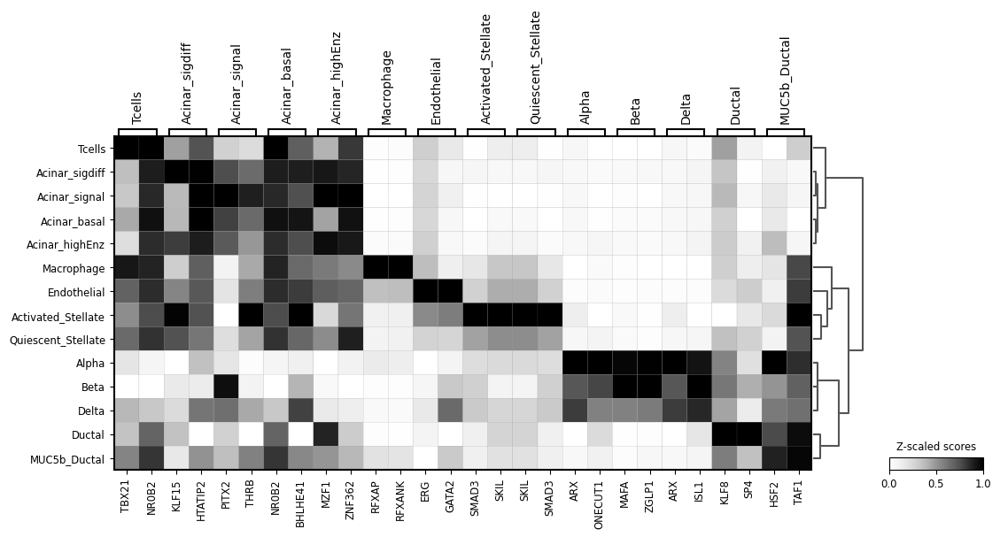

In [41]:
sc.pl.matrixplot(acts_12, source_markers_12, 'CellTypes_max', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys')

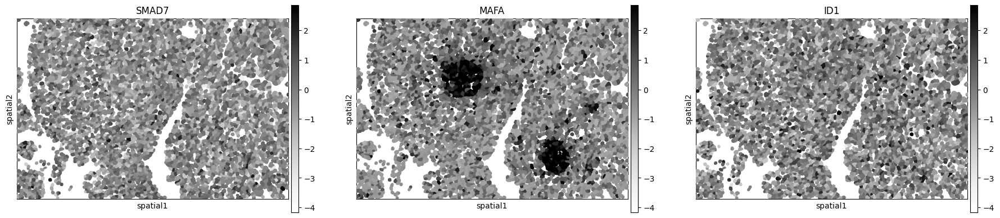

In [68]:
sq.pl.spatial_segment(acts_10,color=['SMAD7','MAFA','ID1'],ncols=3,
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

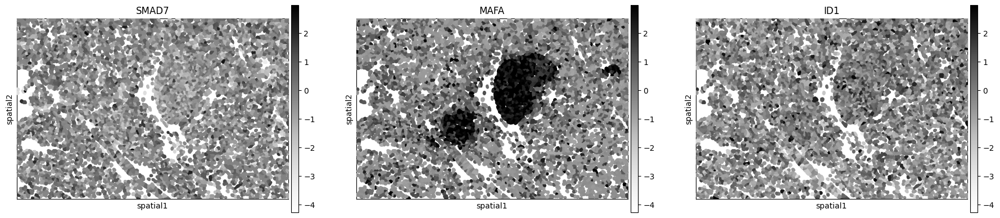

In [69]:
sq.pl.spatial_segment(acts_12,color=['SMAD7','MAFA','ID1'],ncols=3,
                      library_key='fov', seg_cell_id='cell_ID',cmap='Greys', img=False)

### Functional enrichment of biological terms

In [48]:
msigdb = dc.get_resource('MSigDB')
msigdb

Retrying (Retry(total=2, connect=None, read=None, redirect=5, status=None)) after connection broken by 'SSLError(SSLZeroReturnError(6, 'TLS/SSL connection has been closed (EOF) (_ssl.c:1133)'))': /resources?format=json
56.5kB [00:00, 5.07MB/s]
528MB [00:07, 70.1MB/s] 


,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP
...,...,...,...
3838543,PRAMEF22,go_biological_process,GOBP_POSITIVE_REGULATION_OF_CELL_POPULATION_PR...
3838544,PRAMEF22,go_biological_process,GOBP_APOPTOTIC_PROCESS
3838545,PRAMEF22,go_biological_process,GOBP_REGULATION_OF_CELL_DEATH
3838546,PRAMEF22,go_biological_process,GOBP_NEGATIVE_REGULATION_OF_DEVELOPMENTAL_PROCESS


In [53]:
msigdb['collection'].cat.categories

Index(['biocarta_pathways', 'cancer_gene_neighborhoods', 'cancer_modules',
       'cell_type_signatures', 'chemical_and_genetic_perturbations',
       'go_biological_process', 'go_cellular_component',
       'go_molecular_function', 'hallmark', 'human_phenotype_ontology',
       'immunesigdb', 'kegg_pathways', 'mirna_targets_legacy',
       'mirna_targets_mirdb', 'oncogenic_signatures', 'pid_pathways',
       'positional', 'reactome_pathways', 'tf_targets_gtrf',
       'tf_targets_legacy', 'vaccine_response', 'wikipathways'],
      dtype='string')

In [54]:
# Filter by hallmark
msigdb = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]

# Rename
msigdb.loc[:, 'geneset'] = [name.split('HALLMARK_')[1] for name in msigdb['geneset']]

msigdb

/tmp/ipykernel_2007594/2098377670.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['IL2_STAT5_SIGNALING', 'COAGULATION', 'HYPOXIA', 'TNFA_SIGNALING_VIA_NFKB', 'COMPLEMENT', 'HYPOXIA', 'P53_PATHWAY', 'TNFA_SIGNALING_VIA_NFKB', 'GLYCOLYSIS', 'APOPTOSIS', 'IL2_STAT5_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB', 'TNFA_SIGNALING_VIA_NFKB', 'EPITHELIAL_MESENCHYMAL_TRANSITION', 'IL2_STAT5_SIGNALING', 'TNFA_SIGNALING_VIA_NFKB', 'TNFA_SIGNALING_VIA_NFKB', 'PROTEIN_SECRETION', 'ADIPOGENESIS', 'BILE_ACID_METABOLISM', 'INFLAMMATORY_RESPONSE', 'INFLAMMATORY_RESPONSE', 'TNFA_SIGNALING_VIA_NFKB', 'UNFOLDED_PROTEIN_RESPONSE', 'TNFA_SIGNALING_VIA_NFKB', 'IL2_STAT5_SIGNALING', 'P53_PATHWAY', 'TNFA_SIGNALING_VIA_NFKB', 'TGF_BETA_SIGNALING', 'KRAS_SIGNALING_UP', 'UV_RESPONSE_UP', 'APOPTOSIS', 'TNFA_SIGNALING_VIA_NFKB', 'APOPTOSIS', 'ALLOGRAFT_REJECTION', 'INTERFERON_GAMMA_RESPONSE', 'INTERFERON_ALPHA_RESPONSE', 'TNFA_SIGNALING_VIA_NFKB',

,genesymbol,collection,geneset
233,MAFF,hallmark,IL2_STAT5_SIGNALING
250,MAFF,hallmark,COAGULATION
270,MAFF,hallmark,HYPOXIA
373,MAFF,hallmark,TNFA_SIGNALING_VIA_NFKB
377,MAFF,hallmark,COMPLEMENT
...,...,...,...
1449668,STXBP1,hallmark,PANCREAS_BETA_CELLS
1450315,ELP4,hallmark,PANCREAS_BETA_CELLS
1450526,GCG,hallmark,PANCREAS_BETA_CELLS
1450731,PCSK2,hallmark,PANCREAS_BETA_CELLS


In [55]:
dc.run_ora(
    mat=adata_10,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False
)

# Store in a different key
adata_10.obsm['msigdb_ora_estimate'] = adata_10.obsm['ora_estimate'].copy()
adata_10.obsm['msigdb_ora_pvals'] = adata_10.obsm['ora_pvals'].copy()

dc.run_ora(
    mat=adata_12,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True,
    use_raw=False
)

# Store in a different key
adata_12.obsm['msigdb_ora_estimate'] = adata_12.obsm['ora_estimate'].copy()
adata_12.obsm['msigdb_ora_pvals'] = adata_12.obsm['ora_pvals'].copy()


Running ora on mat with 4423 samples and 979 targets for 46 sources.


100%|██████████| 4423/4423 [00:01<00:00, 2623.54it/s]


Running ora on mat with 5208 samples and 979 targets for 46 sources.


100%|██████████| 5208/5208 [00:01<00:00, 3324.89it/s]


In [57]:
import numpy as np
acts_bt_10 = dc.get_acts(adata_10, obsm_key='msigdb_ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v_10 = acts_bt_10.X.ravel()
max_e_10 = np.nanmax(acts_v_10[np.isfinite(acts_v_10)])
acts_bt_10.X[~np.isfinite(acts_bt_10.X)] = max_e_10

acts_bt_12 = dc.get_acts(adata_12, obsm_key='msigdb_ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v_12 = acts_bt_12.X.ravel()
max_e_12 = np.nanmax(acts_v_12[np.isfinite(acts_v_12)])
acts_bt_12.X[~np.isfinite(acts_bt_12.X)] = max_e_12

acts_bt_10, acts_bt_12

(AnnData object with n_obs × n_vars = 4423 × 46
     obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max'
     uns: 'CellTypes_max_colors', 'cell_type_coarse_colors', 'log1p', 'neighbors', 'pca', 'spatial', 'umap', 'dendrogram_CellTypes_max'
     obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_fov', 'mlm_estimate', 'mlm_pvals', 'ulm_estimate', 'ulm_pvals', 'ora_estimate', 'ora_pvals', 'msigdb_ora_estimate', 'msigdb_ora_pvals',
 AnnData object with n_obs

In [58]:
bt_10 = dc.rank_sources_groups(acts_bt_10, groupby='CellTypes_max', reference='rest', method='t-test_overestim_var')
bt_10

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,Acinar_basal,rest,MYC_TARGETS_V1,3.281146,0.535852,0.001083,0.005534
1,Acinar_basal,rest,UNFOLDED_PROTEIN_RESPONSE,2.604240,0.262877,0.009396,0.028813
2,Acinar_basal,rest,ESTROGEN_RESPONSE_EARLY,2.007510,0.322750,0.045065,0.109105
3,Acinar_basal,rest,MTORC1_SIGNALING,1.692669,0.202901,0.090946,0.174313
4,Acinar_basal,rest,IL6_JAK_STAT3_SIGNALING,1.465860,0.253134,0.143115,0.219443
...,...,...,...,...,...,...,...
639,Tcells,rest,PANCREAS_BETA_CELLS,-1.847076,-0.406266,0.066416,0.413535
640,Tcells,rest,P53_PATHWAY,-2.096556,-0.452565,0.037072,0.284222
641,Tcells,rest,APOPTOSIS,-2.227959,-0.669780,0.026827,0.246811
642,Tcells,rest,XENOBIOTIC_METABOLISM,-2.378015,-0.431727,0.018183,0.246811


In [59]:
bt_12 = dc.rank_sources_groups(acts_bt_12, groupby='CellTypes_max', reference='rest', method='t-test_overestim_var')
bt_12

,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,Acinar_basal,rest,IL6_JAK_STAT3_SIGNALING,3.770851,0.507644,0.000171,0.000715
1,Acinar_basal,rest,UNFOLDED_PROTEIN_RESPONSE,3.475330,0.294368,0.000530,0.001874
2,Acinar_basal,rest,KRAS_SIGNALING_DN,2.788857,0.201342,0.005378,0.015461
3,Acinar_basal,rest,MYC_TARGETS_V1,2.454255,0.334000,0.014266,0.032275
4,Acinar_basal,rest,MTORC1_SIGNALING,2.371387,0.233107,0.017885,0.032909
...,...,...,...,...,...,...,...
639,Tcells,rest,REACTIVE_OXYGEN_SPECIES_PATHWAY,-2.315102,-0.369727,0.021621,0.124318
640,Tcells,rest,BILE_ACID_METABOLISM,-2.915897,-0.430142,0.004077,0.031254
641,Tcells,rest,MYOGENESIS,-3.095656,-0.984398,0.002266,0.020844
642,Tcells,rest,COMPLEMENT,-3.352027,-0.773002,0.000969,0.011142


In [65]:
n_top = 2
term_markers_10 = bt_10.groupby('group').head(n_top).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
term_markers_12 = bt_12.groupby('group').head(n_top).groupby('group')['names'].apply(lambda x: list(x)).to_dict()

term_markers_10, term_markers_12 

({'Acinar_basal': ['MYC_TARGETS_V1', 'UNFOLDED_PROTEIN_RESPONSE'],
  'Acinar_highEnz': ['MYC_TARGETS_V1', 'ESTROGEN_RESPONSE_EARLY'],
  'Acinar_sigdiff': ['XENOBIOTIC_METABOLISM', 'G2M_CHECKPOINT'],
  'Acinar_signal': ['MTORC1_SIGNALING', 'MYC_TARGETS_V1'],
  'Activated_Stellate': ['MYOGENESIS', 'EPITHELIAL_MESENCHYMAL_TRANSITION'],
  'Alpha': ['PANCREAS_BETA_CELLS', 'BILE_ACID_METABOLISM'],
  'Beta': ['PANCREAS_BETA_CELLS', 'BILE_ACID_METABOLISM'],
  'Delta': ['PANCREAS_BETA_CELLS', 'COAGULATION'],
  'Ductal': ['APOPTOSIS', 'CHOLESTEROL_HOMEOSTASIS'],
  'Endothelial': ['COAGULATION', 'INTERFERON_GAMMA_RESPONSE'],
  'MUC5b_Ductal': ['INTERFERON_ALPHA_RESPONSE', 'IL2_STAT5_SIGNALING'],
  'Macrophage': ['ALLOGRAFT_REJECTION', 'INTERFERON_ALPHA_RESPONSE'],
  'Quiescent_Stellate': ['MYOGENESIS', 'EPITHELIAL_MESENCHYMAL_TRANSITION'],
  'Tcells': ['ALLOGRAFT_REJECTION', 'INTERFERON_GAMMA_RESPONSE']},
 {'Acinar_basal': ['IL6_JAK_STAT3_SIGNALING', 'UNFOLDED_PROTEIN_RESPONSE'],
  'Acinar_highEn

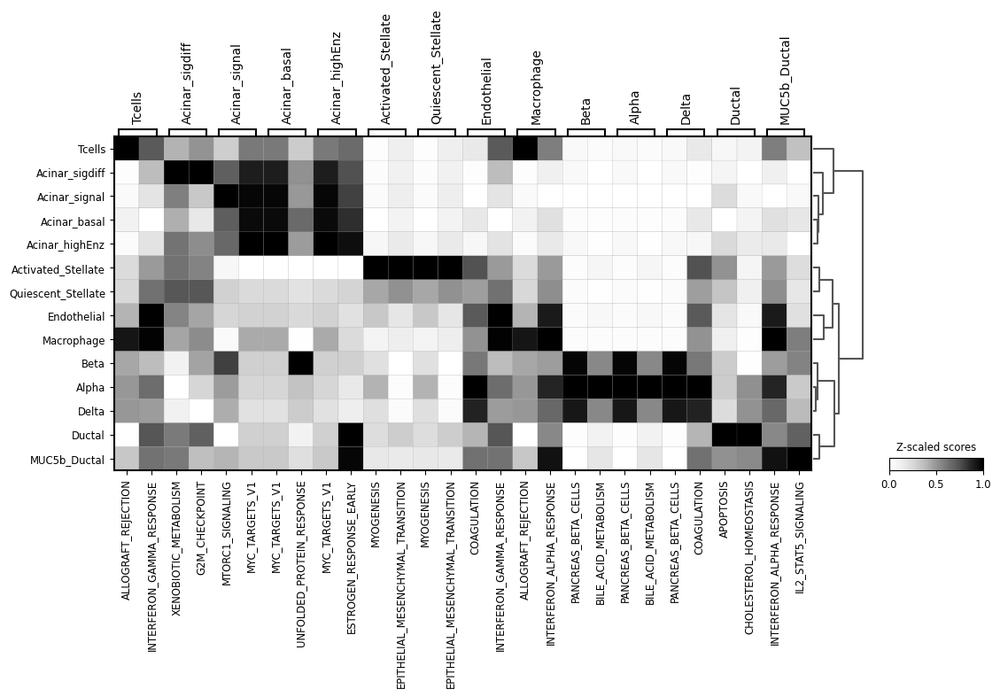

In [66]:
sc.pl.matrixplot(acts_bt_10, term_markers_10, 'CellTypes_max', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys', swap_axes=False)


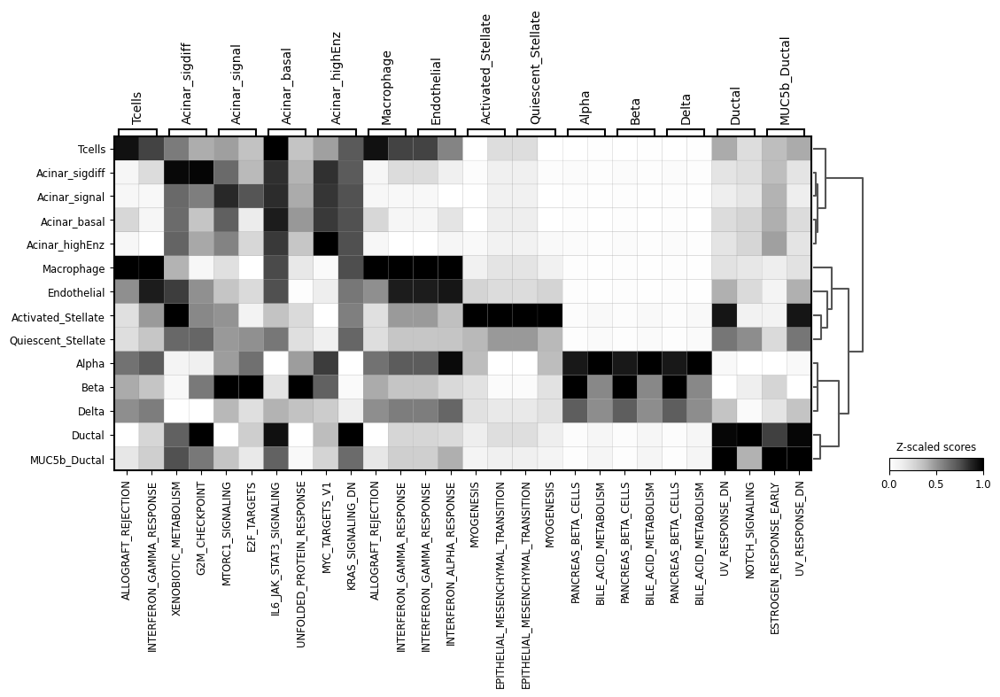

In [67]:
sc.pl.matrixplot(acts_bt_12, term_markers_12, 'CellTypes_max', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='Greys', swap_axes=False)


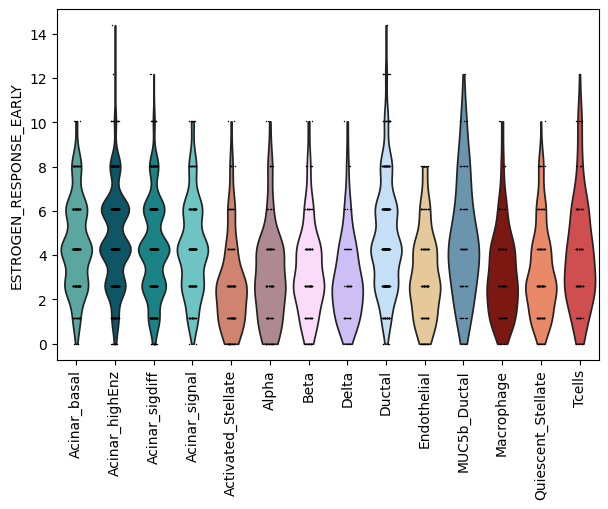

In [77]:
sc.pl.violin(
    acts_bt_10,
    keys='ESTROGEN_RESPONSE_EARLY',
    groupby='CellTypes_max',
    rotation=90
)

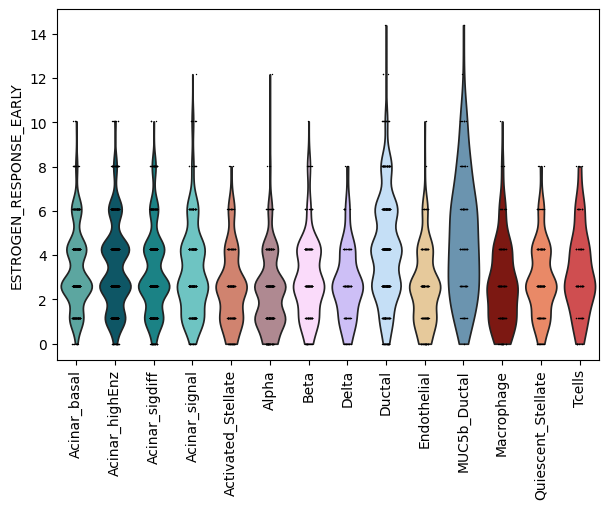

In [78]:
sc.pl.violin(
    acts_bt_12,
    keys='ESTROGEN_RESPONSE_EARLY',
    groupby='CellTypes_max',
    rotation=90
)